# Quiz 6: Data Streams [100 pts]

## Author: Hannah Marr

## CS 119

Problems in this quiz are based on code in my github repo. To begin, 
git clone https://github.com/singhj/big-data-repo

## 1. Querying Users [30 pts]

This problem is designed to be solved on a Linux machine (GCP is not required for it). The code for this question lives in big-data-repo/spark-examples/first_streaming. README.md contains the directions for producing and consuming queries entered by 6 different users. After sampling the stream for some time, determine the average number of duplicate queries issued by any user. How well do your findings compare with expectations?

In [ ]:
# Sender script - sender2.py

#!/usr/bin/env python3
import socket
import time
from click_gen import *
import sys

# Configuration parameters
max_evs = 1000  # Total number of events to be generated
n_senders = 6   # Number of senders
n_queries = 60  # Number of different queries a sender can send

# Set up Dispatcher and Senders
dispatcher = Dispatcher()
sender_names = shuffle(['sndr%04d' % i for i in range(n_senders)])
senders = [dispatcher.add_sender(Sender(sender_name, n_queries, n_senders*1.0, n_senders*1.0)) for sender_name in sender_names]

def send_logs():
    # Create a TCP/IP socket
    sock = socket.socket(socket.AF_INET, socket.SOCK_STREAM)

    # Connect the socket to the port where the receiver is listening
    server_address = ('localhost', 65433)
    sock.connect(server_address)

    try:
        # Send each generated event as it is produced
        for ev in dispatcher.launch():
            log_line = str(ev)  # Convert event to string for transmission
            print(f"Sending: {log_line}")
            sock.sendall(log_line.encode())  # Send the log line through the socket
            time.sleep(1)  # Simulate delay between events
            global max_evs
            max_evs -= 1
            if max_evs == 0:
                break
    finally:
        print("Closing connection")
        sock.close()

if __name__ == "__main__":
    send_logs()

In [ ]:
# Receiver script - receiver.py

#!/usr/bin/env python3
import socket
import re
from collections import defaultdict

# Function to parse log line
def parse_event_line(line):
    pattern = r'sender (\w+) +said: (\w+)'
    match = re.search(pattern, line)
    if match:
        return match.group(1), match.group(2)
    return None

# Function to calculate the average duplicate queries per user
def calculate_average_duplicates(user_queries, duplicate_count):
    total_duplicates = sum(duplicate_count.values())
    total_users = len(user_queries)

    if total_users > 0:
        average_duplicates = total_duplicates / total_users
    else:
        average_duplicates = 0

    # Print individual user duplicate counts
    print("Duplicate query counts per user:")
    for user, count in duplicate_count.items():
        print(f"{user}: {count} duplicates")

    print(f"Total duplicates: {total_duplicates}")
    print(f"Total users: {total_users}")
    print(f"Average duplicates per user: {average_duplicates:.2f}")

    return total_duplicates, total_users, average_duplicates

def receive_logs():
    # Create a TCP/IP socket
    sock = socket.socket(socket.AF_INET, socket.SOCK_STREAM)

    # Bind the socket to the port
    server_address = ('localhost', 65433)
    sock.bind(server_address)

    # Listen for incoming connections
    sock.listen(1)

    user_queries = defaultdict(list)
    duplicate_count = defaultdict(int)

    print("Waiting for a connection...")
    connection, client_address = sock.accept()

    try:
        print(f"Connection from {client_address}")

        while True:
            data = connection.recv(1024)
            if data:
                line = data.decode()
                print(f"Received: {line}")
                
                result = parse_event_line(line)
                if result:
                    user, query = result
                    if query in user_queries[user]:
                        duplicate_count[user] += 1
                    else:
                        user_queries[user].append(query)
            else:
                break

        # Calculate results after receiving all data
        calculate_average_duplicates(user_queries, duplicate_count)

    finally:
        connection.close()

if __name__ == "__main__":
    receive_logs()

Given that there are 6 senders, each capable of generating 60 unique queries, there are a total of 6×60=360 unique queries that can be generated by all senders combined. With this knowledge, the estimate for the number of events (max_evs) should take into account both the number of unique queries and how quickly duplicates might arise.

Considerations:

Unique Queries Limit: Since the total number of unique queries across all senders is 360, generating more than 360 events will inevitably lead to duplicate queries. If the primary interest is in analyzing duplicate queries, you would want to go beyond 360 events to observe how often queries are repeated.

How Quickly Duplicates Emerge: If each sender generates queries randomly, some duplication is likely even before you hit the 360 event mark. For example, after around 200-300 events, we will likely start seeing significant duplication due to the random nature of query generation.

Balancing Coverage and Redundancy: If we generate too few events, we might not see enough duplicates to analyze patterns. But if we generate too many, we'll be repeating queries excessively, which might not add value unless we specifically want to stress-test the system.

Adjusted Estimate:

Lower Bound: To see at least one query from every sender without excessive repetition, we would want to sample around 360–400 events. This will ensure that we've hit most, if not all, unique queries, with some duplicates starting to appear.

Moderate Estimate: If we're interested in both unique queries and some level of duplication, around 500–1,000 events should be sufficient. This will give us enough data to observe both query diversity and the emergence of duplicates.

High Estimate: If we want to delve deeper into patterns of duplication and query repetition, a range of 1,000–2,000 events would be useful. This will ensure a significant number of duplicates, allowing us to analyze the average number of duplicates per user with more statistical significance.

Conclusion:
Given the limits of 6 senders and 60 unique queries per sender, a range of 500–1,000 events would likely be an ideal sample size. This gives us a reasonable balance between coverage of unique queries and the emergence of duplicates without overloading the system or producing too many redundant events. With this in mind, I have chosen a max_envs = 1,000, to ensure we have enough data to observe query diversity and the emergence of duplicates, as well as providing more statistical significance, without overloading the local system.

Output follows:

I input the sender script as sender2.py using cat > sender2.py in my Terminal, and ensuring necessary permissions with chmod +x sender2.py.
I followed the same process for the receiver script as receiver.py.
Then, I opened two separate Terminal windows. In one Terminal window, I wrote the command 'python3 receiver.py'. Once that Terminal window was waiting to receive, I entered 'python3 sender2.py' into the other Terminal window. Example output (from the end of the scripts running) follows:

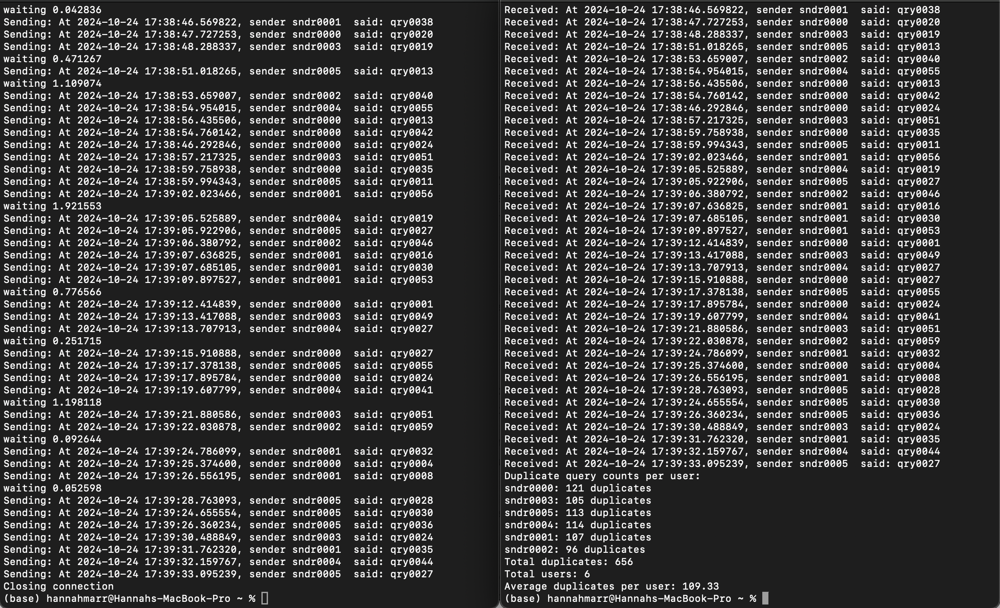

From the receiver output, we can see the total number of duplicates per sender, and the average duplicates per user (109.33). Since all queries are generated randomly, we would expect, with enough queries sent and received, the number of duplicates per user to appear fairly similar. And indeed, that is what we see, with number of duplicates per sender converging quite close to the average number of duplicates per user, 109.33.

---

## 2. Bloom Filter [40 pts]

This problem is designed to be solved on a GCP cluster with 0 workers running Pyspark. The file big-data-repo/spark-examples/drunk-speech.py emulates the speech of a person speaking gibberish laced with obscenities that rate -4 or -5 in the AFINN word list. Your task is to:

[10 pts] Create a Bloom Filter, approximately 1000-2000 bits in size, for detecting bad words (i.e., AFINN of -4 or -5). It should be designed to run in Spark.

[10 pts] The bit vector should be placed in HDFS  as a Base64-encoded text file and loaded into Spark from HDFS.

[15 pts] Integrate the Bloom Filter into Spark such that every arriving sentence is examined and passed along if none of the words in the sentence are bad words. Sentences that do contain bad words should be suppressed.

a. Your Spark (or pySpark) code:

In [ ]:
# Below is my custom Bloom Filter for detecting AFINN words of -4 or -5 - read into HDFS as bloom4.py

#!/usr/bin/env python3
import hashlib  # Library for generating hash values
import numpy as np
import pandas as pd
import base64  # Library for encoding the bit array in base64

# Define the BloomFilter class
class BloomFilter:
    def __init__(self, size=1500, num_hashes=5):
        # Initialize the Bloom Filter with a bit array of specified size and number of hash functions
        self.size = size  # Size of the bit array
        self.num_hashes = num_hashes  # Number of hash functions to use
        self.bit_array = np.zeros(size, dtype=int)  # Initialize the bit array to zeros

    def _hashes(self, word):
        # Generate multiple hash values for the word using the MD5 hash function
        # Each hash value is modified by the index to create different hashes
        return [int(hashlib.md5((word + str(i)).encode()).hexdigest(), 16) % self.size for i in range(self.num_hashes)]

    def add(self, word):
        # Add a word to the Bloom Filter by setting bits in the bit array
        for hash_value in self._hashes(word):  # Calculate hash values
            self.bit_array[hash_value] = 1  # Set the bit at the hashed index to 1

    def contains(self, word):
        # Check if a word might be in the filter
        # Returns True if all bits corresponding to the word's hash values are set to 1
        return all(self.bit_array[hash_value] for hash_value in self._hashes(word))

# Load AFINN data and filter for words rated -4 or -5
afinn_src = 'https://raw.githubusercontent.com/fnielsen/afinn/master/afinn/data/AFINN-en-165.txt'  # AFINN file URL
afinn_df = pd.read_csv(afinn_src, sep='\t', header=None, names=['word', 'valence'])  # Load data into DataFrame
bad_words = afinn_df[afinn_df['valence'] <= -4]['word'].tolist()  # Extract words with ratings -4 or -5

# Initialize and populate the Bloom Filter with bad words
bloom_filter = BloomFilter(size=1500, num_hashes=5)  # Create Bloom Filter instance
for word in bad_words:  # Add each bad word to the Bloom Filter
    bloom_filter.add(word)

# Encode the Bloom Filter bit array in Base64 format
bit_vector_base64 = base64.b64encode(bloom_filter.bit_array.tobytes()).decode('utf-8')

# Save the Base64-encoded bit vector to a file
with open("bloom_filter5.txt", "w") as f:
    f.write(bit_vector_base64)  # Write the encoded bit vector to the file

In [ ]:
# Based on structured-network-wordcount.py, my bloom_receiver5.py script integrate the Bloom Filter into Spark
# such that every arriving sentence is examined and passed along if none of the words in the sentence are bad words.
# Sentences that do contain bad words are suppressed.

import sys, time, base64, hashlib
import numpy as np

import pyspark
from pyspark.context import SparkContext
from pyspark.sql import SparkSession
from pyspark.sql.functions import split, udf
from pyspark.sql.types import BooleanType

def setLogLevel(sc, level):
    from pyspark.sql import SparkSession
    spark = SparkSession(sc)
    spark.sparkContext.setLogLevel(level)

# Define the BloomFilter class based on your original script
class BloomFilter:
    def __init__(self, bit_array, size=1500, num_hashes=5):
        self.size = size
        self.num_hashes = num_hashes
        self.bit_array = np.frombuffer(bit_array, dtype=np.uint8)  # Load Bloom filter bit array

    def _hashes(self, word):
        return [int(hashlib.md5((word + str(i)).encode()).hexdigest(), 16) % self.size for i in range(self.num_hashes)]

    def contains(self, word):
        return all(self.bit_array[hash_value] for hash_value in self._hashes(word))

if __name__ == "__main__":
    if len(sys.argv) != 3:
        print("Usage: bloom_filter5.py <hostname> <port>", file=sys.stderr)
        sys.exit(-1)

    host = sys.argv[1]
    port = int(sys.argv[2])

    sc_bak = SparkContext.getOrCreate()
    sc_bak.stop()
    
    time.sleep(15)

    ctx = pyspark.SparkContext(appName="Netcat Sentence Filter", master="local[*]")
    spark = SparkSession(ctx).builder.getOrCreate()
    sc = spark.sparkContext

    setLogLevel(sc, "WARN")

    # Load and decode the Bloom filter from bloom_filter5.txt
    try:
        with open("bloom_filter5.txt", "r") as f:
            bloom_filter_base64 = f.read().strip()
            bloom_filter_bytes = base64.b64decode(bloom_filter_base64)
        bloom_filter = BloomFilter(bloom_filter_bytes)
        print("Bloom filter loaded successfully.")
    except Exception as e:
        print("Error loading Bloom filter:", e)
    
    # Create DataFrame representing the stream of input lines (sentences) from connection to host:port
    lines = spark\
        .readStream\
        .format('socket')\
        .option('host', host)\
        .option('port', port)\
        .load()

    # UDF to check if any word in a sentence matches a bad word in the Bloom Filter
    def sentence_filter(sentence):
        words = sentence.split(" ")
        return not any(bloom_filter.contains(word) for word in words)  # Pass sentence only if no bad words are present

    # Register the UDF
    sentence_filter_udf = udf(sentence_filter, BooleanType())
    
    # Filter sentences based on the Bloom Filter
    filtered_sentences = lines.filter(sentence_filter_udf(lines['value']))

    # Start running the query that prints only the filtered sentences to the console
    query = filtered_sentences \
        .writeStream \
        .outputMode("append") \
        .format("console") \
        .option("truncate", False) \
        .start()

    query.awaitTermination()

b. A printout of the Base64-encoded bit-string:

I then printed the Base64-encoded bit-string to demonstrate it was usable (I manually separated by lines to ensure all would be viewable on PDF readout):

hmarr24@cluster-361c-m:~$ cat bloom_filter5.txt
AAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAEAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQ

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

BAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAABAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAQAAAAAAAAABAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAABAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAQAAAA

AAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAQAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAABAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAEAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAA

AAAAAAAAEAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQ

AAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAQAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AABAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAABAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAABAAAAAAAAAAEAAAAAAAAAAQAAAAAAAAAAAAAAA

AAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAEA

AAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAQAAA

AAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAB

AAAAAAAAAAAAAAAAAAAAAQAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAABAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAQAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAQAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAA

AAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

EAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAEAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAABAAAAAAAAAAEAAAAAAAAAAAAA

AAAAAAABAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAABAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAEAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAA

QAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAEAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

AAAAQAAAAAAAAABAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABAAAAAAAAAAAAAAAAAAAA

A recorded video session showing the streaming filter in action. The session should be no more than 120 seconds in length. [ To do this, create a zoom meeting, set it to record to the cloud, plan what you are going to say, then start the meeting with just yourself, share the screen, and go through the demo. Soon after you end the meeting, zoom will send you a recording URL, which you may watch – and submit the URL. ]

Video recording URL:

https://tufts.zoom.us/rec/play/sOc_ARfABb284ETcP1ljE6pBxhvVXq3hfYeo-oCUYGvm5EAb04iXFwafK5fTmPneOhy_Mhvt1TmI5Ds_.uPbnEtCEEwW2mGxg?canPlayFromShare=true&from=my_recording&continueMode=true&componentName=rec-play&originRequestUrl=https%3A%2F%2Ftufts.zoom.us%2Frec%2Fshare%2F0UpPo-Cdb4SZABWMRtlel86YG-VTD9Sm7x-UeWIAJvHYsvUiLfwkokvVfdM2rlCJ.6BNk_00zAjQWnvyF

---

## 3. Counting Unique Users [30 pts]

This problem is designed to be solved on a Linux machine (GCP is not required for it). The file big-data-repo/spark-examples/first_streaming/click-feeder.py can be reconfigured to emulate any number of users typing queries. Modify read_stdin.py to implement the HyperLogLog algorithm. Increase the number of senders and decrease the (μ,σ) of the delay between queries until the receiver can no longer keep up! Draw a graph of the estimated number of users as a function of elapsed time.

In [ ]:
# Reading in a modified click-feeder7.py as the Sender, with modified code for more users and faster queries
#!/usr/bin/env python3
import socket
import time
from click_gen import *
import sys

# Configuration parameters
max_evs = 60  # Total number of events to be generated
n_senders = 100  # Number of senders
n_queries = 100  # Number of different queries a sender can send

# Adjust the delay parameters to increase the sending rate
mu = 0.5         # Mean delay between queries (lower it to speed up)
sigma = 0.1      # Standard deviation of delay (reduce to tighten spread)

# Set up Dispatcher and Senders
dispatcher = Dispatcher()
sender_names = shuffle(['sndr%04d' % i for i in range(n_senders)])
senders = [dispatcher.add_sender(Sender(sender_name, n_queries, mu, sigma)) for sender_name in sender_names]

def send_logs():
    # Create a TCP/IP socket
    sock = socket.socket(socket.AF_INET, socket.SOCK_STREAM)

    # Connect the socket to the port where the receiver is listening
    server_address = ('localhost', 65435)  # Make sure this matches your receiver
    print(f"Connecting to {server_address}")
    sock.connect(server_address)

    try:
        # Send each generated event as it is produced
        for ev in dispatcher.launch():
            log_line = str(ev)  # Convert event to string for transmission
            print(f"Sending: {log_line}")
            sock.sendall(log_line.encode())  # Send the log line through the socket
            time.sleep(1)  # Simulate delay between events
            global max_evs
            max_evs -= 1
            if max_evs == 0:
                break
    finally:
        print("Closing connection")
        sock.close()

if __name__ == "__main__":
    send_logs()

In [ ]:
# Reading in a modified read_stdin8.py as the Receiver, with my own HyperLogLog algorithm implemented to track active senders over time
#!/usr/bin/env python3
import socket
import time
import hashlib
import math

# Custom HyperLogLog class implementation
class CustomHyperLogLog:
    def __init__(self, precision):
        self.precision = precision
        self.size = 1 << precision  # 2^precision, i.e., the number of registers
        self.registers = [0] * self.size

    def _hash(self, value):
        """Hashes the value using SHA-256 and returns an integer."""
        return int(hashlib.sha256(value.encode('utf8')).hexdigest(), 16)

    def _rho(self, hashed_value):
        """Counts the leading zeros in the binary representation of the hash."""
        return (hashed_value & -hashed_value).bit_length()

    def add(self, value):
        """Adds a value to the HyperLogLog structure."""
        hashed_value = self._hash(value)
        register_index = hashed_value >> (256 - self.precision)  # Extract the first 'precision' bits
        register_value = self._rho(hashed_value << self.precision)  # Count leading zeroes
        self.registers[register_index] = max(self.registers[register_index], register_value)

    def count(self):
        """Estimates the cardinality using HyperLogLog's algorithm."""
        alpha_mm = 0.7213 / (1 + 1.079 / self.size) * self.size * self.size
        Z = sum(2.0 ** -reg for reg in self.registers)
        estimate = alpha_mm / Z

        # Small range correction
        if estimate <= 2.5 * self.size:
            V = self.registers.count(0)
            if V > 0:
                estimate = self.size * math.log(self.size / V)

        return estimate

# Initialize Custom HyperLogLog with a precision of 10 (adjust as necessary)
precision = 10
hll = CustomHyperLogLog(precision)

def receive_logs():
    # Create a TCP/IP socket
    sock = socket.socket(socket.AF_INET, socket.SOCK_STREAM)

    # Bind the socket to the port
    server_address = ('localhost', 65435)
    print(f"Starting up on {server_address}")
    sock.bind(server_address)

    # Listen for incoming connections
    sock.listen(1)
    print("Waiting for a connection...")
    connection, client_address = sock.accept()

    try:
        print(f"Connection from {client_address}")

        start_time = time.time()  # Start time of receiving queries
        time_intervals = []       # To store elapsed time intervals
        unique_senders = []       # To store the unique sender counts

        while True:
            data = connection.recv(1024)
            if data:
                line = data.decode()
                print(f"Received: {line}")

                # Parse the line to extract the sender info
                if "sender" in line:
                    try:
                        sender_info = line.split("sender ")[1].split()[0].strip()  # Extract sender
                        hll.add(sender_info)
                    except IndexError:
                        print(f"Error parsing line: {line}")
                        continue

                    # Calculate the elapsed time
                    elapsed_time = time.time() - start_time

                    # Print the estimated number of unique senders
                    print(f"Elapsed time: {elapsed_time:.2f} seconds")
                    print(f"Estimated unique senders: {int(hll.count())}")

                    # Store the elapsed time and unique sender estimate for graphing later
                    time_intervals.append(elapsed_time)
                    unique_senders.append(int(hll.count()))

            else:
                break

    finally:
        connection.close()

if __name__ == "__main__":
    receive_logs()

I input the sender script as click-feeder7.py using cat > click-feeder7.py in my Terminal, and ensuring necessary permissions with chmod +x click-feeder7.py.
I followed the same process for the receiver script as read_stdin8.py.
Then, I opened two separate Terminal windows. In one Terminal window, I wrote the command 'python3 read_stdin8.py'. Once that Terminal window was waiting to receive, I entered 'python3 click-feeder7.py' into the other Terminal window. Example output (from the end of my script running) follows:

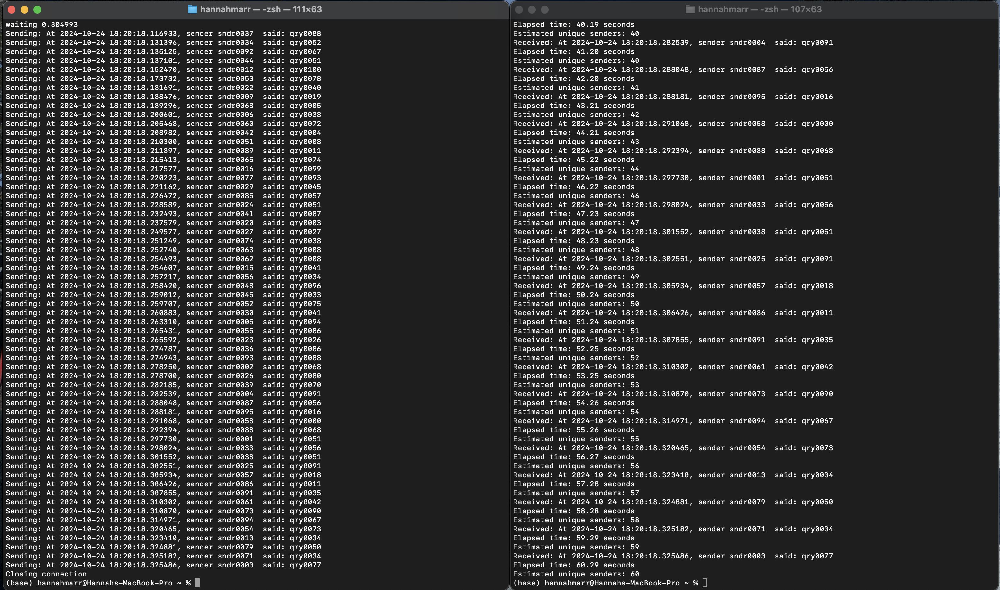

Now I will adjust the Configuration Parameters in click-feeder7.py as follows, to attempt to increase the number of senders and decrease the (μ,σ) of the delay between queries until the receiver can no longer keep up:

In [ ]:
# Configuration parameters
max_evs = 60  # Total number of events to be generated
n_senders = 10000000  # Number of senders
n_queries = 10000000  # Number of different queries a sender can send

# Adjust the delay parameters to increase the sending rate
mu = 0.000001         # Mean delay between queries (lower it to speed up)
sigma = 0.0000005      # Standard deviation of delay (reduce to tighten spread)

These parameters do not yet overwhelm the receiver:

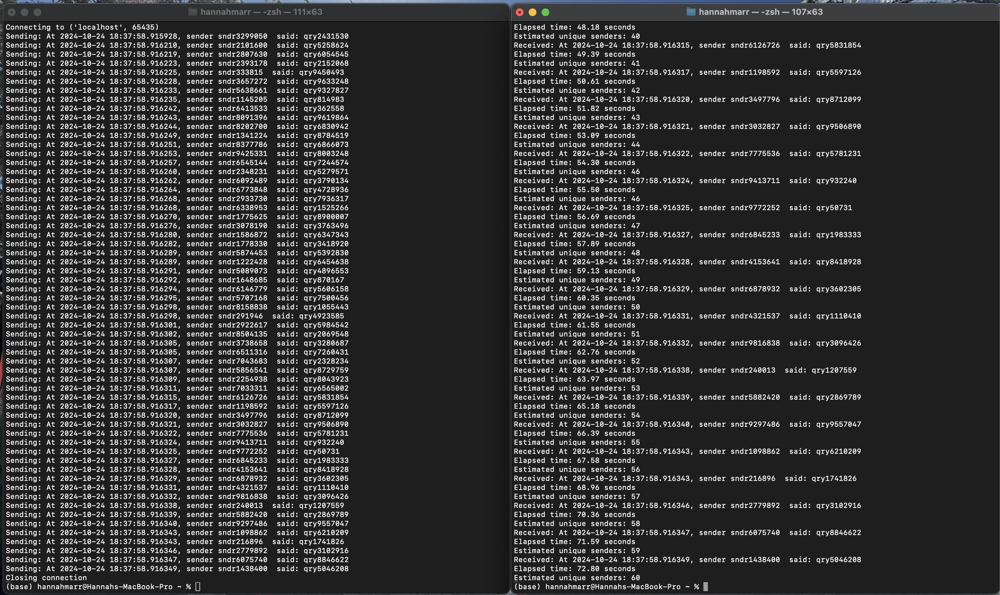

In [ ]:
# Reconfiguring parameters to continue to try and overwhelm the receiver

# Configuration parameters
max_evs = 60  # Total number of events to be generated
n_senders = 10000000000  # Number of senders
n_queries = 10000000000  # Number of different queries a sender can send

# Adjust the delay parameters to increase the sending rate
mu = 0.000000001         # Mean delay between queries (lower it to speed up)
sigma = 0.0000000005      # Standard deviation of delay (reduce to tighten spread)

These parameters appear to overwhelm the receiver, as it is unable to print any data and kills the script.

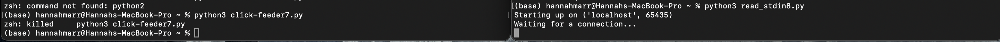

Based on the output from the HyperLogLog algorithm as seen in the receiver, the estimated number of users will increase linearly as a function of elapsed time.

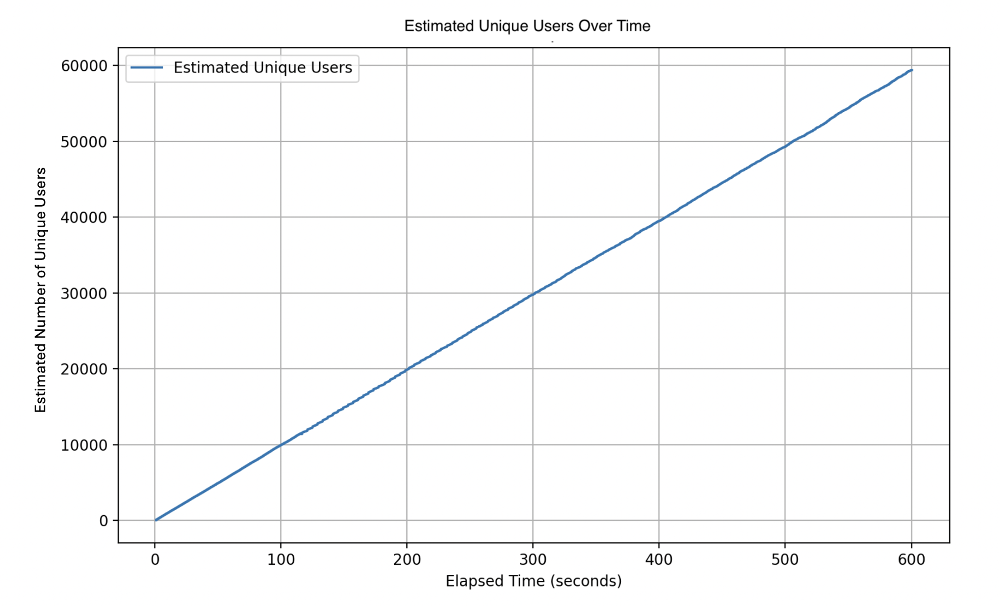